In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('concrete_data.csv')

# Basic info
print(df.info())
print(df.describe())
print(df.isnull().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1030 entries, 0 to 1029
Data columns (total 9 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   cement                         1030 non-null   float64
 1   blast_furnace_slag             1030 non-null   float64
 2   fly_ash                        1030 non-null   float64
 3   water                          1030 non-null   float64
 4   superplasticizer               1030 non-null   float64
 5   coarse_aggregate               1030 non-null   float64
 6   fine_aggregate                 1030 non-null   float64
 7   age                            1030 non-null   int64  
 8   concrete_compressive_strength  1030 non-null   float64
dtypes: float64(8), int64(1)
memory usage: 72.6 KB
None
            cement  blast_furnace_slag      fly_ash        water  \
count  1030.000000         1030.000000  1030.000000  1030.000000   
mean    281.167864           73.895825    

In [21]:
# Check for duplicates
print(f"Duplicate rows: {df.duplicated().sum()}")

# Remove duplicates if any
df = df.drop_duplicates()

# Check for missing values
print(df.isnull().sum())

# Handle missing values if any (this dataset appears complete)
# df = df.dropna()  # if needed

Duplicate rows: 25
cement                           0
blast_furnace_slag               0
fly_ash                          0
water                            0
superplasticizer                 0
coarse_aggregate                 0
fine_aggregate                   0
age                              0
concrete_compressive_strength    0
dtype: int64


In [22]:
df = df.rename(columns={'fine_aggregate ': 'fine_aggregate'})  # Remove space

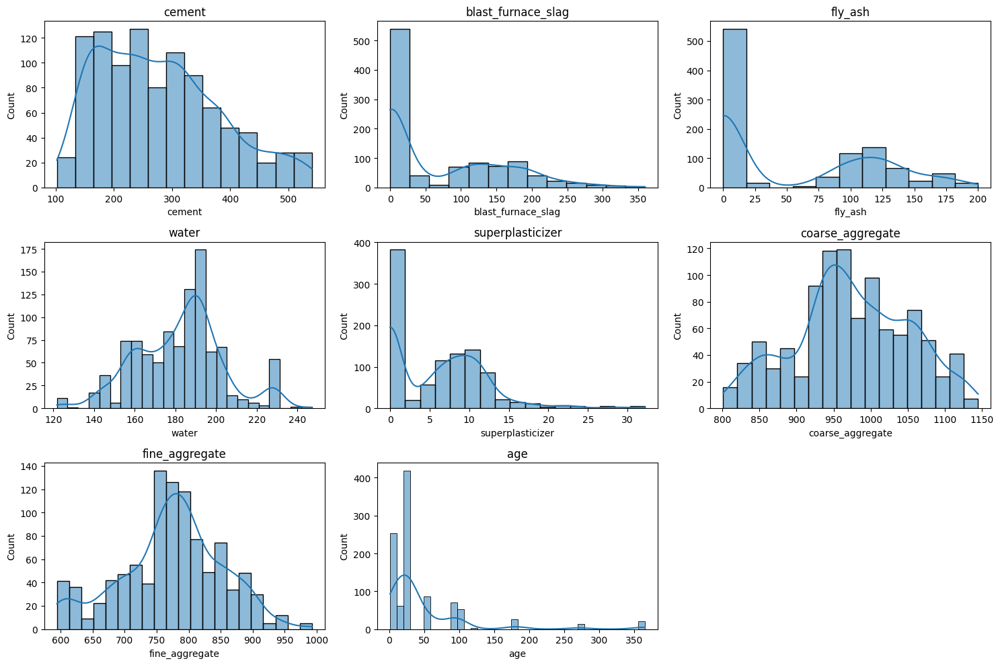

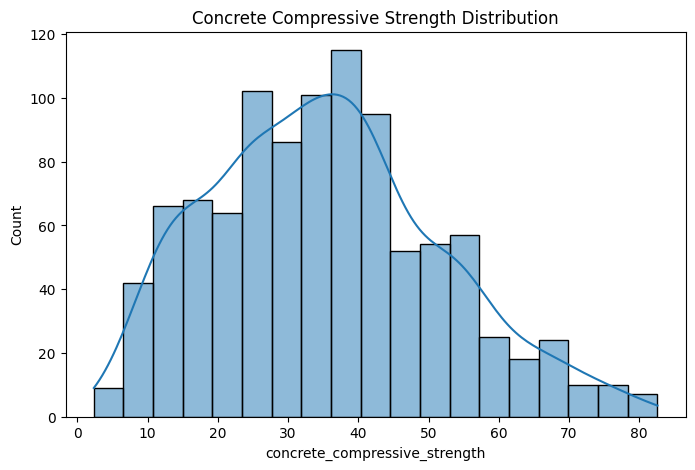

In [23]:
# List of features
features = ['cement', 'blast_furnace_slag', 'fly_ash', 'water', 'superplasticizer', 
            'coarse_aggregate', 'fine_aggregate', 'age', 'concrete_compressive_strength']

# Visualize distributions
plt.figure(figsize=(15, 10))
for i, col in enumerate(features[:-1]):  # exclude target
    plt.subplot(3, 3, i+1)
    sns.histplot(df[col], kde=True)
    plt.title(col)
plt.tight_layout()
plt.show()

# Target variable distribution
plt.figure(figsize=(8, 5))
sns.histplot(df['concrete_compressive_strength'], kde=True)
plt.title('Concrete Compressive Strength Distribution')
plt.show()

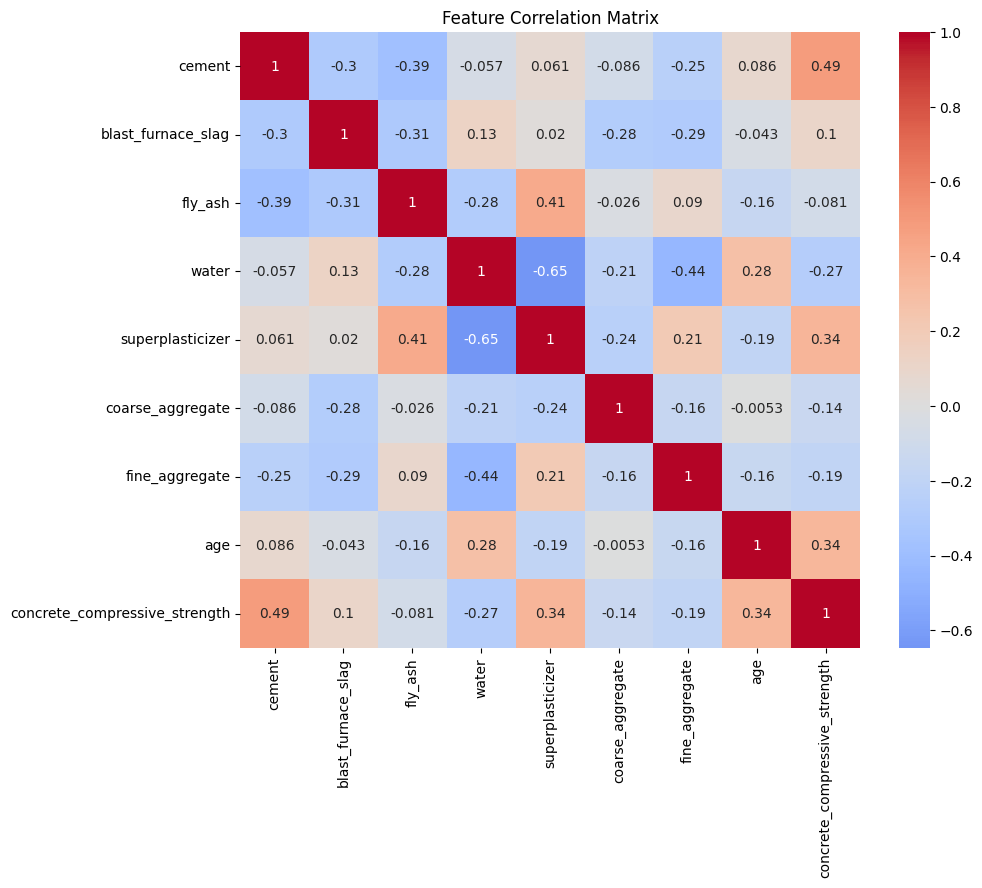

Correlation with compressive strength:
concrete_compressive_strength    1.000000
cement                           0.488283
superplasticizer                 0.344209
age                              0.337367
blast_furnace_slag               0.103374
fly_ash                         -0.080648
coarse_aggregate                -0.144717
fine_aggregate                  -0.186448
water                           -0.269624
Name: concrete_compressive_strength, dtype: float64


In [24]:
# Correlation matrix
corr = df.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', center=0)
plt.title('Feature Correlation Matrix')
plt.show()

# Top correlations with target
target_corr = corr['concrete_compressive_strength'].sort_values(ascending=False)
print("Correlation with compressive strength:")
print(target_corr)

In [25]:
# Create water-to-cement ratio (important in concrete strength)
df['water_cement_ratio'] = df['water'] / df['cement']

# Create aggregate ratio
df['aggregate_ratio'] = df['coarse_aggregate'] / df['fine_aggregate']

# Create total binder content
df['total_binder'] = df['cement'] + df['blast_furnace_slag'] + df['fly_ash']

# Check new feature correlations
new_features = ['water_cement_ratio', 'aggregate_ratio', 'total_binder']
for feat in new_features:
    corr = df[feat].corr(df['concrete_compressive_strength'])
    print(f"{feat} correlation with strength: {corr:.3f}")

water_cement_ratio correlation with strength: -0.489
aggregate_ratio correlation with strength: 0.075
total_binder correlation with strength: 0.598


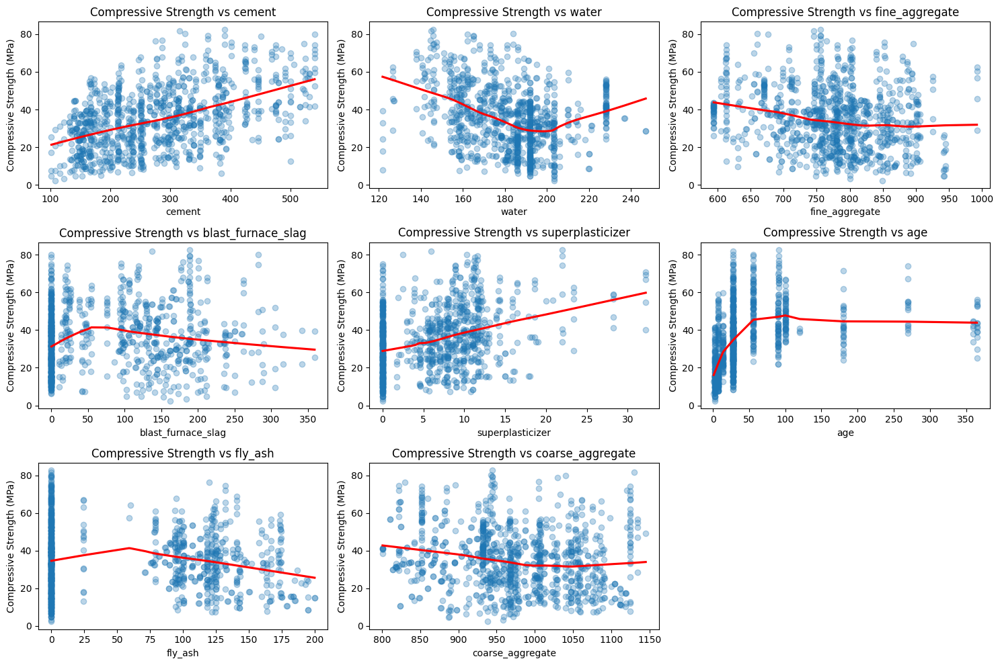

In [26]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Charger les données (remplacez par votre DataFrame)
# df = pd.read_csv("votre_fichier.csv")

# Variables à analyser
features = ['cement', 'water', 'fine_aggregate', 'blast_furnace_slag', 
            'superplasticizer', 'age', 'fly_ash', 'coarse_aggregate']

# Ajuster la taille des graphiques
plt.figure(figsize=(15, 10))

# Afficher les courbes de lissage pour chaque variable
for i, feature in enumerate(features, 1):
    plt.subplot(3, 3, i)
    sns.regplot(
        x=df[feature], 
        y=df['concrete_compressive_strength'],
        lowess=True,  # Activation du lissage LOESS
        line_kws={'color': 'red'},  # Couleur de la courbe
        scatter_kws={'alpha': 0.3}  # Transparence des points
    )
    plt.title(f"Compressive Strength vs {feature}")
    plt.xlabel(feature)
    plt.ylabel("Compressive Strength (MPa)")

plt.tight_layout()
plt.show()

In [27]:
df.isna().sum()


cement                           0
blast_furnace_slag               0
fly_ash                          0
water                            0
superplasticizer                 0
coarse_aggregate                 0
fine_aggregate                   0
age                              0
concrete_compressive_strength    0
water_cement_ratio               0
aggregate_ratio                  0
total_binder                     0
dtype: int64

In [28]:
df.duplicated().sum()


0

In [29]:
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Load your dataset
df = pd.read_csv("concrete_data.csv")

# Separate features and target
X = df.drop("concrete_compressive_strength", axis=1)
y = df["concrete_compressive_strength"]

# Initialize StandardScaler
scaler = StandardScaler()

# Fit and transform the data
X_scaled = scaler.fit_transform(X)

# Convert back to DataFrame (optional)
X_scaled = pd.DataFrame(X_scaled, columns=X.columns)

# Verify standardization (mean ≈ 0, std ≈ 1)
print(X_scaled.describe().round(2))

        cement  blast_furnace_slag  fly_ash    water  superplasticizer  \
count  1030.00             1030.00  1030.00  1030.00           1030.00   
mean     -0.00               -0.00    -0.00    -0.00             -0.00   
std       1.00                1.00     1.00     1.00              1.00   
min      -1.72               -0.86    -0.85    -2.80             -1.04   
25%      -0.85               -0.86    -0.85    -0.78             -1.04   
50%      -0.08               -0.60    -0.85     0.16              0.03   
75%       0.66                0.80     1.00     0.49              0.67   
max       2.48                3.31     2.28     3.07              4.35   

       coarse_aggregate  fine_aggregate       age  
count           1030.00          1030.00  1030.00  
mean               0.00            -0.00     0.00  
std                1.00             1.00     1.00  
min               -2.21            -2.24    -0.71  
25%               -0.53            -0.53    -0.61  
50%               -0.

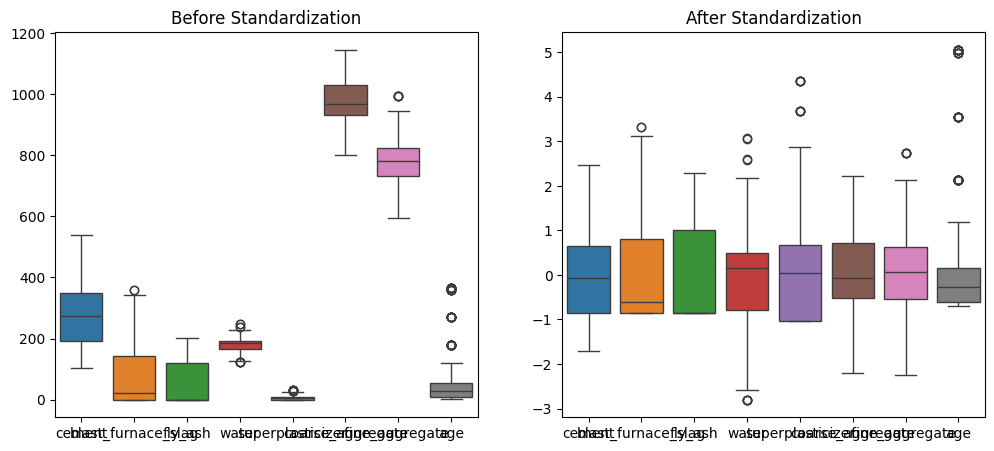

In [30]:
import matplotlib.pyplot as plt

# Before standardization
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.boxplot(data=X)
plt.title("Before Standardization")

# After standardization
plt.subplot(1, 2, 2)
sns.boxplot(data=X_scaled)
plt.title("After Standardization")
plt.show()

In [31]:

from sklearn.model_selection import train_test_split

# Load the dataset
df = pd.read_csv("concrete_data.csv")
X = df.drop("concrete_compressive_strength", axis=1)
y = df["concrete_compressive_strength"]

# Bin the target into 3 classes (Low, Medium, High)
y_binned = pd.cut(y, bins=3, labels=["Low", "Medium", "High"])

# Check class distribution
print("Original Class Distribution:")
print(y_binned.value_counts())

Original Class Distribution:
concrete_compressive_strength
Medium    520
Low       378
High      132
Name: count, dtype: int64


In [32]:
from imblearn.over_sampling import SMOTE

# Split data (SMOTE should only be applied to training data)
X_train, X_test, y_train, y_test = train_test_split(X, y_binned, test_size=0.2, random_state=42)

# Apply SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Check new distribution
print("\nClass Distribution After SMOTE:")
print(y_train_smote.value_counts())


Class Distribution After SMOTE:
concrete_compressive_strength
Low       404
Medium    404
High      404
Name: count, dtype: int64


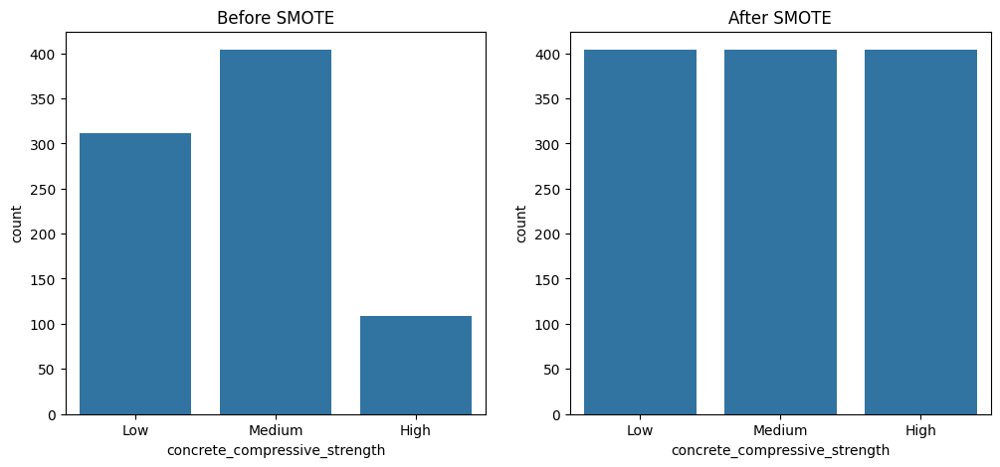

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns

# Before SMOTE
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.countplot(x=y_train)
plt.title("Before SMOTE")

# After SMOTE
plt.subplot(1, 2, 2)
sns.countplot(x=y_train_smote)
plt.title("After SMOTE")
plt.show()

In [34]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import xgboost as xgb
from sklearn.ensemble import AdaBoostRegressor
import lightgbm as lgb

# Load data
df = pd.read_csv("concrete_data.csv")
X = df.drop("concrete_compressive_strength", axis=1)
y = df["concrete_compressive_strength"]

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [56]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
import xgboost as xgb

# XGBoost model
xgb_model = xgb.XGBRegressor(
    n_estimators=300,
    max_depth=3,
    learning_rate=0.2,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)

xgb_model.fit(X_train, y_train)
xgb_pred = xgb_model.predict(X_test)

# Evaluation
mse = mean_squared_error(y_test, xgb_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, xgb_pred)
r2 = r2_score(y_test, xgb_pred)

# Print results
print("XGBoost Results:")
print(f"MAE: {mae:.2f}")
print(f"MSE: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R²: {r2:.2f}")


XGBoost Results:
MAE: 2.93
MSE: 18.48
RMSE: 4.30
R²: 0.93


In [63]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error, mean_squared_log_error
import numpy as np

# LightGBM model
lgb_model = lgb.LGBMRegressor(
    num_leaves=31,
    max_depth=5,
    learning_rate=0.05,
    n_estimators=200,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)

lgb_model.fit(X_train, y_train)
lgb_pred = lgb_model.predict(X_test)

# Evaluation
rmse = np.sqrt(mean_squared_error(y_test, lgb_pred))
mse = mean_squared_error(y_test, lgb_pred)
mae = mean_absolute_error(y_test, lgb_pred)
r2 = r2_score(y_test, lgb_pred)

# Pour éviter les erreurs avec des 0 dans y_test
y_test_safe = np.where(y_test == 0, 1e-10, y_test)
mape = mean_absolute_percentage_error(y_test_safe, lgb_pred)

# Si y_test et y_pred >= 0 (sinon, MSLE n'est pas applicable)
try:
    msle = mean_squared_log_error(y_test, lgb_pred)
except ValueError:
    msle = "Non calculable (valeurs négatives dans les données)"
# Calcul des erreurs
mae = mean_absolute_error(y_test, lgb_pred)
mse = mean_squared_error(y_test, lgb_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, lgb_pred)

# Affichage des résultats
print("\nLightGBM Results:")
print(f"MAE : {mae:.2f}")
print(f"MSE : {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print("\nLightGBM Results:")
print(f"RMSE: {rmse:.2f}")
print(f"MSE: {mse:.2f}")
print(f"MAE: {mae:.2f}")
print(f"R²: {r2:.2f}")

 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 973
[LightGBM] [Info] Number of data points in the train set: 824, number of used features: 8
[LightGBM] [Info] Start training from score 35.857864
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

In [37]:
import optuna
import xgboost as xgb
from sklearn.model_selection import cross_val_score, KFold
import pandas as pd
# Define the objective function with closure
def create_objective(X, y):
    def objective(trial):
        params = {
            'max_depth': trial.suggest_int('max_depth', 3, 10),
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
            'n_estimators': trial.suggest_int('n_estimators', 100, 500),
            'subsample': trial.suggest_float('subsample', 0.5, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
            'gamma': trial.suggest_float('gamma', 0, 5),
            'reg_alpha': trial.suggest_float('reg_alpha', 0, 5),
            'reg_lambda': trial.suggest_float('reg_lambda', 0, 5),
            'random_state': 42,
        }

        model = xgb.XGBRegressor(**params)
        kf = KFold(n_splits=5, shuffle=True, random_state=42)
        scores = cross_val_score(model, X, y, scoring='neg_mean_squared_error', cv=kf)
        return -scores.mean()
    
    return objective

# Create the study
study = optuna.create_study(direction='minimize')
study.optimize(create_objective(X, y), n_trials=100)

# Best parameters
print("Best trial:")
print(study.best_trial)
print("Best parameters:")
print(study.best_params)

# Train final model with best parameters
best_model = xgb.XGBRegressor(**study.best_params)
best_model.fit(X, y)

[I 2025-04-15 20:55:27,007] A new study created in memory with name: no-name-df5b038e-700e-4ed7-bf62-89199cf18c5b
[I 2025-04-15 20:55:27,772] Trial 0 finished with value: 19.303942174034326 and parameters: {'max_depth': 6, 'learning_rate': 0.08534517439758978, 'n_estimators': 443, 'subsample': 0.6546386655116718, 'colsample_bytree': 0.5618269053790585, 'gamma': 2.5038161150836813, 'reg_alpha': 4.591960428763985, 'reg_lambda': 0.0055463786031478834}. Best is trial 0 with value: 19.303942174034326.
[I 2025-04-15 20:55:28,243] Trial 1 finished with value: 19.157419015609268 and parameters: {'max_depth': 7, 'learning_rate': 0.21318619974872974, 'n_estimators': 132, 'subsample': 0.9478119085265849, 'colsample_bytree': 0.5312675881463829, 'gamma': 0.09955525805494414, 'reg_alpha': 0.48173970809013755, 'reg_lambda': 4.853284777396042}. Best is trial 1 with value: 19.157419015609268.
[I 2025-04-15 20:55:29,000] Trial 2 finished with value: 20.827750869231433 and parameters: {'max_depth': 9, 'l

Best trial:
FrozenTrial(number=89, state=1, values=[16.093408932534963], datetime_start=datetime.datetime(2025, 4, 15, 20, 56, 24, 999322), datetime_complete=datetime.datetime(2025, 4, 15, 20, 56, 25, 692075), params={'max_depth': 4, 'learning_rate': 0.11552579638193972, 'n_estimators': 400, 'subsample': 0.951975179852383, 'colsample_bytree': 0.7135253412990568, 'gamma': 0.0044458751418512965, 'reg_alpha': 1.9391826509917085, 'reg_lambda': 1.2351103069071607}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'max_depth': IntDistribution(high=10, log=False, low=3, step=1), 'learning_rate': FloatDistribution(high=0.3, log=False, low=0.01, step=None), 'n_estimators': IntDistribution(high=500, log=False, low=100, step=1), 'subsample': FloatDistribution(high=1.0, log=False, low=0.5, step=None), 'colsample_bytree': FloatDistribution(high=1.0, log=False, low=0.5, step=None), 'gamma': FloatDistribution(high=5.0, log=False, low=0.0, step=None), 'reg_alpha': FloatDistributi

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.7135253412990568, device=None,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0.0044458751418512965,
             grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.11552579638193972,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=4, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=400, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [38]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.model_selection import train_test_split
import numpy as np

# Optionally split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit best model on train
best_model.fit(X_train, y_train)

# Predict on test
y_pred = best_model.predict(X_test)

# Metrics
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"R² Score: {r2:.4f}")
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")


R² Score: 0.9314
MAE: 2.8470
MSE: 17.6684
RMSE: 4.2034


In [39]:
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor

stack = StackingRegressor(
    estimators=[
        ('xgb', best_model),
        ('rf', RandomForestRegressor(n_estimators=100, random_state=42))
    ],
    final_estimator=Ridge()
)

stack.fit(X_train, y_train)
y_pred = stack.predict(X_test)
print("Stacked R2:", r2_score(y_test, y_pred))



Stacked R2: 0.9305092692554652


In [65]:
import pandas as pd
import numpy as np
import optuna
import lightgbm as lgb
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score
import optuna.visualization as vis

# Optuna objective function
def objective(trial):
    params = {
        'num_leaves': trial.suggest_int('num_leaves', 20, 150),
        'max_depth': trial.suggest_int('max_depth', 3, 15),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 0, 5),
        'reg_lambda': trial.suggest_float('reg_lambda', 0, 5),
        'random_state': 42
    }

    model = lgb.LGBMRegressor(**params)
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    score = cross_val_score(model, X_train, y_train, scoring='neg_mean_squared_error', cv=kf, n_jobs=-1)
    return -score.mean()

# Create and run study
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)

# Best parameters
print("\nBest Trial:")
print(study.best_trial)
print("\nBest Parameters:")
print(study.best_params)

# Train model with best parameters
best_lgb = lgb.LGBMRegressor(**study.best_params)
best_lgb.fit(X_train, y_train)
y_pred = best_lgb.predict(X_test)

# Evaluation
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
print("\n🔍 Tuned LightGBM Performance:")
print(f"RMSE: {rmse:.2f}")
print(f"R²: {r2:.4f}")

# Visualization (Optional, for Jupyter)
try:
    vis.plot_optimization_history(study).show()
    vis.plot_param_importances(study).show()
except:
    print("Visualization requires a Jupyter environment or interactive backend.")

# Affichage des résultats
print("\nLightGBM Results:")
print(f"MAE : {mae:.2f}")
print(f"MSE : {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print("\nLightGBM Results:")
print(f"RMSE: {rmse:.2f}")
print(f"MSE: {mse:.2f}")
print(f"MAE: {mae:.2f}")
print(f"R²: {r2:.2f}")


[I 2025-04-16 00:47:19,250] A new study created in memory with name: no-name-85eeadd9-7627-47eb-87f1-ff6638773f28
[I 2025-04-16 00:47:19,790] Trial 0 finished with value: 23.122258861890664 and parameters: {'num_leaves': 94, 'max_depth': 7, 'learning_rate': 0.10875195008186818, 'n_estimators': 327, 'subsample': 0.9804128756810766, 'colsample_bytree': 0.9378972865317917, 'reg_alpha': 4.4739331993617855, 'reg_lambda': 3.125065775771398}. Best is trial 0 with value: 23.122258861890664.
[I 2025-04-16 00:47:20,086] Trial 1 finished with value: 22.22069034444808 and parameters: {'num_leaves': 70, 'max_depth': 11, 'learning_rate': 0.2849995914528324, 'n_estimators': 135, 'subsample': 0.7401211044339402, 'colsample_bytree': 0.742398464333299, 'reg_alpha': 4.935473080914058, 'reg_lambda': 2.613273576799529}. Best is trial 1 with value: 22.22069034444808.
[I 2025-04-16 00:47:20,527] Trial 2 finished with value: 25.287368907916175 and parameters: {'num_leaves': 40, 'max_depth': 5, 'learning_rate'


Best Trial:
FrozenTrial(number=34, state=1, values=[21.067288999923285], datetime_start=datetime.datetime(2025, 4, 16, 0, 47, 42, 651648), datetime_complete=datetime.datetime(2025, 4, 16, 0, 47, 43, 398890), params={'num_leaves': 74, 'max_depth': 12, 'learning_rate': 0.09918242797788303, 'n_estimators': 444, 'subsample': 0.8600356512252405, 'colsample_bytree': 0.6587989840753796, 'reg_alpha': 0.007347632490988465, 'reg_lambda': 2.60892940578054}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'num_leaves': IntDistribution(high=150, log=False, low=20, step=1), 'max_depth': IntDistribution(high=15, log=False, low=3, step=1), 'learning_rate': FloatDistribution(high=0.3, log=False, low=0.01, step=None), 'n_estimators': IntDistribution(high=500, log=False, low=100, step=1), 'subsample': FloatDistribution(high=1.0, log=False, low=0.5, step=None), 'colsample_bytree': FloatDistribution(high=1.0, log=False, low=0.5, step=None), 'reg_alpha': FloatDistribution(high=5.0, l


LightGBM Results:
MAE : 2.85
MSE : 19.49
RMSE: 4.41

LightGBM Results:
RMSE: 4.41
MSE: 19.49
MAE: 2.85
R²: 0.92


In [41]:
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)  # You can increase to 100+ for better results

# Show best results
print("Best trial:")
print(study.best_trial)
print("Best params:")
print(study.best_params)


[I 2025-04-15 20:57:07,950] A new study created in memory with name: no-name-3b76a211-a211-4df5-b08f-7324ffb3c032
[I 2025-04-15 20:57:08,130] Trial 0 finished with value: 32.68516735316858 and parameters: {'num_leaves': 84, 'max_depth': 3, 'learning_rate': 0.035855929129739214, 'n_estimators': 217, 'subsample': 0.6638016684139926, 'colsample_bytree': 0.7207098823073285, 'reg_alpha': 4.486116179455504, 'reg_lambda': 0.24218072017299197}. Best is trial 0 with value: 32.68516735316858.
[I 2025-04-15 20:57:08,505] Trial 1 finished with value: 24.37857327312377 and parameters: {'num_leaves': 84, 'max_depth': 4, 'learning_rate': 0.06869035882747969, 'n_estimators': 439, 'subsample': 0.6934439094657873, 'colsample_bytree': 0.9239477602395194, 'reg_alpha': 0.26952998023331787, 'reg_lambda': 4.730700723590694}. Best is trial 1 with value: 24.37857327312377.
[I 2025-04-15 20:57:08,822] Trial 2 finished with value: 23.480302741206934 and parameters: {'num_leaves': 43, 'max_depth': 14, 'learning_r

Best trial:
FrozenTrial(number=25, state=1, values=[20.77605607726938], datetime_start=datetime.datetime(2025, 4, 15, 20, 57, 16, 904568), datetime_complete=datetime.datetime(2025, 4, 15, 20, 57, 17, 443701), params={'num_leaves': 36, 'max_depth': 10, 'learning_rate': 0.10288888278071705, 'n_estimators': 438, 'subsample': 0.9224635855033587, 'colsample_bytree': 0.5022653713003857, 'reg_alpha': 0.7692549432702611, 'reg_lambda': 3.4952717792791943}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'num_leaves': IntDistribution(high=150, log=False, low=20, step=1), 'max_depth': IntDistribution(high=15, log=False, low=3, step=1), 'learning_rate': FloatDistribution(high=0.3, log=False, low=0.01, step=None), 'n_estimators': IntDistribution(high=500, log=False, low=100, step=1), 'subsample': FloatDistribution(high=1.0, log=False, low=0.5, step=None), 'colsample_bytree': FloatDistribution(high=1.0, log=False, low=0.5, step=None), 'reg_alpha': FloatDistribution(high=5.0, l

In [44]:
from sklearn.compose import TransformedTargetRegressor
from sklearn.preprocessing import FunctionTransformer
from sklearn.metrics import mean_squared_error, r2_score
import lightgbm as lgb
import numpy as np

# Modèle avec transformation sur la target uniquement
model = TransformedTargetRegressor(
    regressor=lgb.LGBMRegressor(**study.best_params),  # ou tes propres hyperparamètres
    func=np.log1p,           # transforme y => log(1 + y)
    inverse_func=np.expm1    # pour revenir à l'échelle originale
)

# Entraînement
model.fit(X_train, y_train)

# Prédiction
y_pred = model.predict(X_test)

# Évaluation
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f"✅ RMSE avec log1p transform: {rmse:.2f}")
print(f"✅ R²: {r2:.2f}")


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 973
[LightGBM] [Info] Number of data points in the train set: 824, number of used features: 8
[LightGBM] [Info] Start training from score 3.485391
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-04-15 21:15:53,517] A new study created in memory with name: no-name-7046a2b3-a5fd-49c5-b245-806934d7cc3e


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 750
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 3.496208
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-04-15 21:15:53,729] Trial 0 finished with value: 24.9696670615892 and parameters: {'num_leaves': 95, 'max_depth': 10, 'learning_rate': 0.21053355671205187, 'n_estimators': 123, 'subsample': 0.9033507931068812, 'colsample_bytree': 0.6467334282717985}. Best is trial 0 with value: 24.9696670615892.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000072 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 750
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 3.496208
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-04-15 21:15:54,806] Trial 1 finished with value: 28.451317802345805 and parameters: {'num_leaves': 32, 'max_depth': 9, 'learning_rate': 0.27540576484736373, 'n_estimators': 965, 'subsample': 0.5169369060216096, 'colsample_bytree': 0.5553065116047085}. Best is trial 0 with value: 24.9696670615892.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000074 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 750
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 3.496208
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-04-15 21:15:55,801] Trial 2 finished with value: 24.326972322134257 and parameters: {'num_leaves': 60, 'max_depth': 10, 'learning_rate': 0.10959127952778057, 'n_estimators': 781, 'subsample': 0.6760731941033606, 'colsample_bytree': 0.5972931733969049}. Best is trial 2 with value: 24.326972322134257.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-15 21:15:56,973] Trial 3 finished with value: 23.718997127904853 and parameters: {'num_leaves': 79, 'max_depth': 10, 'learning_rate': 0.08226266761435672, 'n_estimators': 764, 'subsample': 0.5306576103751719, 'colsample_bytree': 0.5785129727698821}. Best is trial 3 with value: 23.718997127904853.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 750
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 3.496208
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-04-15 21:15:57,416] Trial 4 finished with value: 25.62436465453618 and parameters: {'num_leaves': 89, 'max_depth': 10, 'learning_rate': 0.20868484199134715, 'n_estimators': 325, 'subsample': 0.9750867180782219, 'colsample_bytree': 0.9563169670094847}. Best is trial 3 with value: 23.718997127904853.
[I 2025-04-15 21:15:57,592] Trial 5 finished with value: 24.546431124744235 and parameters: {'num_leaves': 93, 'max_depth': 9, 'learning_rate': 0.15541456494203537, 'n_estimators': 112, 'subsample': 0.536878378637706, 'colsample_bytree': 0.7074996281109911}. Best is trial 3 with value: 23.718997127904853.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000092 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 750
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 3.496208
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-04-15 21:15:58,509] Trial 6 finished with value: 25.0571540064368 and parameters: {'num_leaves': 53, 'max_depth': 10, 'learning_rate': 0.0929695000287146, 'n_estimators': 705, 'subsample': 0.853515642861967, 'colsample_bytree': 0.8651566956276695}. Best is trial 3 with value: 23.718997127904853.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-15 21:15:58,788] Trial 7 finished with value: 24.003032633228223 and parameters: {'num_leaves': 74, 'max_depth': 5, 'learning_rate': 0.13056939908699627, 'n_estimators': 268, 'subsample': 0.9901863223886126, 'colsample_bytree': 0.6406877025801454}. Best is trial 3 with value: 23.718997127904853.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-15 21:15:59,433] Trial 8 finished with value: 25.960135260904558 and parameters: {'num_leaves': 22, 'max_depth': 5, 'learning_rate': 0.24532102572330866, 'n_estimators': 870, 'subsample': 0.7184472731375349, 'colsample_bytree': 0.6356271564269134}. Best is trial 3 with value: 23.718997127904853.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000073 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 746
[LightGBM] [Info] Number of data points in the train set: 660, number of used features: 8
[LightGBM] [Info] Start training from score 3.495898
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-04-15 21:15:59,902] Trial 9 finished with value: 27.54097788534965 and parameters: {'num_leaves': 88, 'max_depth': 5, 'learning_rate': 0.023101342491667683, 'n_estimators': 540, 'subsample': 0.9158926088903407, 'colsample_bytree': 0.9440572609553644}. Best is trial 3 with value: 23.718997127904853.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-15 21:16:00,484] Trial 10 finished with value: 23.441969414849424 and parameters: {'num_leaves': 72, 'max_depth': 7, 'learning_rate': 0.04040886960188303, 'n_estimators': 574, 'subsample': 0.6136849010398293, 'colsample_bytree': 0.8006761087584666}. Best is trial 10 with value: 23.441969414849424.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-15 21:16:01,110] Trial 11 finished with value: 24.53138938073343 and parameters: {'num_leaves': 72, 'max_depth': 7, 'learning_rate': 0.029688787253370284, 'n_estimators': 566, 'subsample': 0.6121962826637735, 'colsample_bytree': 0.8121131617152735}. Best is trial 10 with value: 23.441969414849424.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-15 21:16:01,442] Trial 12 finished with value: 25.707691267331075 and parameters: {'num_leaves': 75, 'max_depth': 3, 'learning_rate': 0.06360791692502506, 'n_estimators': 583, 'subsample': 0.6128870461461332, 'colsample_bytree': 0.762599468284172}. Best is trial 10 with value: 23.441969414849424.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-15 21:16:01,920] Trial 13 finished with value: 23.985489951911237 and parameters: {'num_leaves': 50, 'max_depth': 7, 'learning_rate': 0.0687827439177256, 'n_estimators': 425, 'subsample': 0.5990570298508544, 'colsample_bytree': 0.5363727944929529}. Best is trial 10 with value: 23.441969414849424.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000085 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 747
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 3.491619
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-04-15 21:16:02,856] Trial 14 finished with value: 26.620047279172645 and parameters: {'num_leaves': 80, 'max_depth': 8, 'learning_rate': 0.01310606825654051, 'n_estimators': 682, 'subsample': 0.7860659672552954, 'colsample_bytree': 0.8633541696150437}. Best is trial 10 with value: 23.441969414849424.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 746
[LightGBM] [Info] Number of data points in the train set: 660, number of used features: 8
[LightGBM] [Info] Start training from score 3.495898
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-04-15 21:16:03,678] Trial 15 finished with value: 25.415641300270185 and parameters: {'num_leaves': 64, 'max_depth': 6, 'learning_rate': 0.1586936588017362, 'n_estimators': 844, 'subsample': 0.5620754910626209, 'colsample_bytree': 0.7159978861053073}. Best is trial 10 with value: 23.441969414849424.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000090 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 746
[LightGBM] [Info] Number of data points in the train set: 660, number of used features: 8
[LightGBM] [Info] Start training from score 3.495898
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-04-15 21:16:04,227] Trial 16 finished with value: 24.470875483216613 and parameters: {'num_leaves': 48, 'max_depth': 3, 'learning_rate': 0.06056249363547919, 'n_estimators': 988, 'subsample': 0.6840042925111665, 'colsample_bytree': 0.5011222560113463}. Best is trial 10 with value: 23.441969414849424.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000100 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGB

[I 2025-04-15 21:16:04,820] Trial 17 finished with value: 23.658073164914676 and parameters: {'num_leaves': 62, 'max_depth': 8, 'learning_rate': 0.09645350706505426, 'n_estimators': 435, 'subsample': 0.7830759500505822, 'colsample_bytree': 0.7862509163260988}. Best is trial 10 with value: 23.441969414849424.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000095 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 750
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 3.496208
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-04-15 21:16:05,380] Trial 18 finished with value: 23.48403040702871 and parameters: {'num_leaves': 37, 'max_depth': 8, 'learning_rate': 0.12131647760708297, 'n_estimators': 436, 'subsample': 0.7867582406326605, 'colsample_bytree': 0.7962432878117746}. Best is trial 10 with value: 23.441969414849424.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000084 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 746
[LightGBM] [Info] Number of data points in the train set: 660, number of used features: 8
[LightGBM] [Info] Start training from score 3.495898
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-04-15 21:16:05,863] Trial 19 finished with value: 25.385108141530885 and parameters: {'num_leaves': 39, 'max_depth': 6, 'learning_rate': 0.19337935133371834, 'n_estimators': 420, 'subsample': 0.8085408276879886, 'colsample_bytree': 0.8712375421510603}. Best is trial 10 with value: 23.441969414849424.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000062 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 747
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 3.491619
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-04-15 21:16:06,257] Trial 20 finished with value: 24.810946358577432 and parameters: {'num_leaves': 20, 'max_depth': 8, 'learning_rate': 0.12941215336676742, 'n_estimators': 266, 'subsample': 0.7343340629055888, 'colsample_bytree': 0.8244221377838742}. Best is trial 10 with value: 23.441969414849424.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-15 21:16:06,873] Trial 21 finished with value: 23.840958961915874 and parameters: {'num_leaves': 66, 'max_depth': 8, 'learning_rate': 0.043982947844099715, 'n_estimators': 481, 'subsample': 0.7910200747727272, 'colsample_bytree': 0.7828494010091195}. Best is trial 10 with value: 23.441969414849424.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-15 21:16:07,326] Trial 22 finished with value: 23.461665671854853 and parameters: {'num_leaves': 39, 'max_depth': 7, 'learning_rate': 0.11513461707009101, 'n_estimators': 355, 'subsample': 0.8546058343158298, 'colsample_bytree': 0.7121784944732261}. Best is trial 10 with value: 23.441969414849424.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-15 21:16:07,721] Trial 23 finished with value: 23.185005107186775 and parameters: {'num_leaves': 37, 'max_depth': 7, 'learning_rate': 0.1248566743643219, 'n_estimators': 336, 'subsample': 0.8420167465219112, 'colsample_bytree': 0.7066494939912271}. Best is trial 23 with value: 23.185005107186775.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000070 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 747
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 3.491619
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-04-15 21:16:08,174] Trial 24 finished with value: 24.65868760975308 and parameters: {'num_leaves': 30, 'max_depth': 7, 'learning_rate': 0.17409430957388222, 'n_estimators': 342, 'subsample': 0.8521739970947346, 'colsample_bytree': 0.6886905794968765}. Best is trial 23 with value: 23.185005107186775.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000100 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 747
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 3.491619
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-04-15 21:16:08,495] Trial 25 finished with value: 24.29123265993077 and parameters: {'num_leaves': 43, 'max_depth': 6, 'learning_rate': 0.14001854878085418, 'n_estimators': 212, 'subsample': 0.8625367295867375, 'colsample_bytree': 0.7400581176512555}. Best is trial 23 with value: 23.185005107186775.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-15 21:16:08,984] Trial 26 finished with value: 25.422160711203254 and parameters: {'num_leaves': 55, 'max_depth': 4, 'learning_rate': 0.046032701849141766, 'n_estimators': 628, 'subsample': 0.9260035210757154, 'colsample_bytree': 0.6720106608978355}. Best is trial 23 with value: 23.185005107186775.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000100 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 746
[LightGBM] [Info] Number of data points in the train set: 660, number of used features: 8
[LightGBM] [Info] Start training from score 3.495898
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-04-15 21:16:09,449] Trial 27 finished with value: 23.415326085444132 and parameters: {'num_leaves': 43, 'max_depth': 7, 'learning_rate': 0.1086287411259934, 'n_estimators': 351, 'subsample': 0.6583934171004332, 'colsample_bytree': 0.7445967185281133}. Best is trial 23 with value: 23.185005107186775.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-15 21:16:09,767] Trial 28 finished with value: 25.86077696351149 and parameters: {'num_leaves': 29, 'max_depth': 6, 'learning_rate': 0.17501808145411496, 'n_estimators': 218, 'subsample': 0.6478830047330518, 'colsample_bytree': 0.8975944416965331}. Best is trial 23 with value: 23.185005107186775.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-15 21:16:10,129] Trial 29 finished with value: 24.416104526956747 and parameters: {'num_leaves': 46, 'max_depth': 9, 'learning_rate': 0.07904366514702886, 'n_estimators': 181, 'subsample': 0.6978139488369705, 'colsample_bytree': 0.7473264854847942}. Best is trial 23 with value: 23.185005107186775.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000093 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 747
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 3.491619
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-04-15 21:16:10,650] Trial 30 finished with value: 25.849967777405585 and parameters: {'num_leaves': 69, 'max_depth': 7, 'learning_rate': 0.22825434431060157, 'n_estimators': 485, 'subsample': 0.6475012850257621, 'colsample_bytree': 0.8324558230281993}. Best is trial 23 with value: 23.185005107186775.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-15 21:16:11,118] Trial 31 finished with value: 24.016891943202733 and parameters: {'num_leaves': 36, 'max_depth': 7, 'learning_rate': 0.10431423482613209, 'n_estimators': 358, 'subsample': 0.8874872810511141, 'colsample_bytree': 0.7236384239878004}. Best is trial 23 with value: 23.185005107186775.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-15 21:16:11,591] Trial 32 finished with value: 24.0301341400956 and parameters: {'num_leaves': 42, 'max_depth': 7, 'learning_rate': 0.11373382461587853, 'n_estimators': 364, 'subsample': 0.8295493714132032, 'colsample_bytree': 0.6732164718493963}. Best is trial 23 with value: 23.185005107186775.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000114 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 747
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 3.491619
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-04-15 21:16:12,118] Trial 33 finished with value: 23.70205943932802 and parameters: {'num_leaves': 27, 'max_depth': 6, 'learning_rate': 0.14534127027537194, 'n_estimators': 510, 'subsample': 0.7607775473235425, 'colsample_bytree': 0.6130104755511068}. Best is trial 23 with value: 23.185005107186775.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-15 21:16:12,571] Trial 34 finished with value: 23.450783814398555 and parameters: {'num_leaves': 56, 'max_depth': 8, 'learning_rate': 0.09342353952596405, 'n_estimators': 308, 'subsample': 0.5810873350195666, 'colsample_bytree': 0.7565289489848077}. Best is trial 23 with value: 23.185005107186775.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000077 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 746
[LightGBM] [Info] Number of data points in the train set: 660, number of used features: 8
[LightGBM] [Info] Start training from score 3.495898
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-04-15 21:16:13,088] Trial 35 finished with value: 26.545089137648556 and parameters: {'num_leaves': 53, 'max_depth': 9, 'learning_rate': 0.2913597119336899, 'n_estimators': 316, 'subsample': 0.5552041396289569, 'colsample_bytree': 0.7635331382702157}. Best is trial 23 with value: 23.185005107186775.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000060 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 747
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 3.491619
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-04-15 21:16:13,509] Trial 36 finished with value: 25.180735349867177 and parameters: {'num_leaves': 58, 'max_depth': 8, 'learning_rate': 0.07928459866214281, 'n_estimators': 276, 'subsample': 0.5029207959629902, 'colsample_bytree': 0.9949812541034928}. Best is trial 23 with value: 23.185005107186775.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-15 21:16:13,802] Trial 37 finished with value: 26.766341434470302 and parameters: {'num_leaves': 58, 'max_depth': 8, 'learning_rate': 0.047814412537234424, 'n_estimators': 144, 'subsample': 0.5831438802484494, 'colsample_bytree': 0.686723772877266}. Best is trial 23 with value: 23.185005107186775.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-15 21:16:14,656] Trial 38 finished with value: 25.34054922704395 and parameters: {'num_leaves': 34, 'max_depth': 9, 'learning_rate': 0.08981782468524961, 'n_estimators': 622, 'subsample': 0.631132486881114, 'colsample_bytree': 0.8421525465418787}. Best is trial 23 with value: 23.185005107186775.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000093 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 750
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 3.496208
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-04-15 21:16:15,077] Trial 39 finished with value: 24.994004377404696 and parameters: {'num_leaves': 80, 'max_depth': 5, 'learning_rate': 0.16974950349318976, 'n_estimators': 393, 'subsample': 0.662140809006058, 'colsample_bytree': 0.7698173205527911}. Best is trial 23 with value: 23.185005107186775.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-15 21:16:15,449] Trial 40 finished with value: 23.051509397090875 and parameters: {'num_leaves': 85, 'max_depth': 9, 'learning_rate': 0.10050205250861835, 'n_estimators': 280, 'subsample': 0.5736557700361067, 'colsample_bytree': 0.7404133652900049}. Best is trial 40 with value: 23.051509397090875.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-15 21:16:15,956] Trial 41 finished with value: 23.699290280277456 and parameters: {'num_leaves': 86, 'max_depth': 9, 'learning_rate': 0.10097647207464275, 'n_estimators': 299, 'subsample': 0.5717966359725126, 'colsample_bytree': 0.7346597303137595}. Best is trial 40 with value: 23.051509397090875.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-15 21:16:16,287] Trial 42 finished with value: 23.438133567638396 and parameters: {'num_leaves': 100, 'max_depth': 10, 'learning_rate': 0.1377378157173686, 'n_estimators': 235, 'subsample': 0.5260350747754357, 'colsample_bytree': 0.653755337434207}. Best is trial 40 with value: 23.051509397090875.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000085 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 746
[LightGBM] [Info] Number of data points in the train set: 660, number of used features: 8
[LightGBM] [Info] Start training from score 3.495898
[LightGBM] [Warning] No further splits with positive gain

[I 2025-04-15 21:16:16,685] Trial 43 finished with value: 24.146223994662318 and parameters: {'num_leaves': 97, 'max_depth': 10, 'learning_rate': 0.13962919683054817, 'n_estimators': 239, 'subsample': 0.5322413140052519, 'colsample_bytree': 0.6482682138767011}. Best is trial 40 with value: 23.051509397090875.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000098 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 746
[LightGBM] [Info] Number of data points in the train set: 660, number of used features: 8
[LightGBM] [Info] Start training from score 3.495898
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-04-15 21:16:16,995] Trial 44 finished with value: 23.55541527479801 and parameters: {'num_leaves': 91, 'max_depth': 10, 'learning_rate': 0.19310966240887636, 'n_estimators': 149, 'subsample': 0.5413683415094709, 'colsample_bytree': 0.595835908258431}. Best is trial 40 with value: 23.051509397090875.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000066 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 746
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 3.467667
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-04-15 21:16:17,339] Trial 45 finished with value: 24.399100349481152 and parameters: {'num_leaves': 85, 'max_depth': 10, 'learning_rate': 0.13086983934639473, 'n_estimators': 184, 'subsample': 0.5104104013197714, 'colsample_bytree': 0.6460416505578217}. Best is trial 40 with value: 23.051509397090875.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-15 21:16:18,289] Trial 46 finished with value: 24.924096807682623 and parameters: {'num_leaves': 99, 'max_depth': 9, 'learning_rate': 0.1533712863158532, 'n_estimators': 702, 'subsample': 0.6260781598491051, 'colsample_bytree': 0.6889679578170657}. Best is trial 40 with value: 23.051509397090875.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-15 21:16:18,720] Trial 47 finished with value: 23.81873973687066 and parameters: {'num_leaves': 76, 'max_depth': 10, 'learning_rate': 0.12368184589004304, 'n_estimators': 244, 'subsample': 0.6041388064548129, 'colsample_bytree': 0.8015879140942774}. Best is trial 40 with value: 23.051509397090875.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-15 21:16:19,243] Trial 48 finished with value: 24.5059206093216 and parameters: {'num_leaves': 83, 'max_depth': 9, 'learning_rate': 0.07117518779779586, 'n_estimators': 384, 'subsample': 0.7013189652943415, 'colsample_bytree': 0.5514172605893461}. Best is trial 40 with value: 23.051509397090875.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-15 21:16:20,035] Trial 49 finished with value: 23.49144675899074 and parameters: {'num_leaves': 96, 'max_depth': 10, 'learning_rate': 0.03485009440114653, 'n_estimators': 520, 'subsample': 0.5460510624958517, 'colsample_bytree': 0.6279675821191183}. Best is trial 40 with value: 23.051509397090875.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

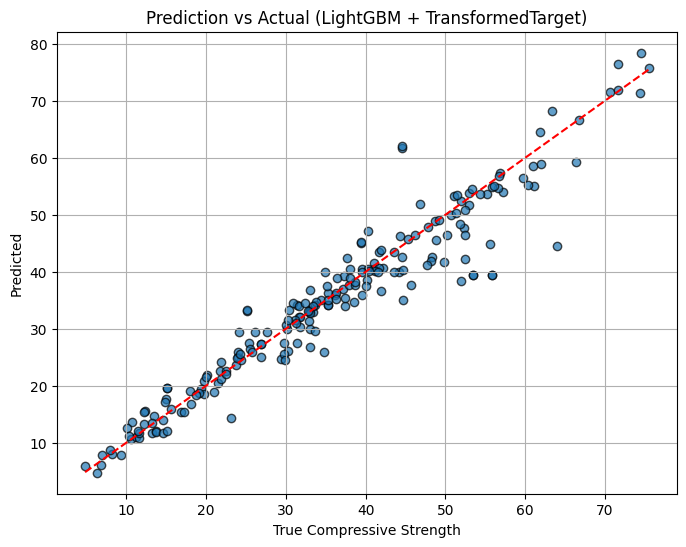

In [46]:
import pandas as pd
import numpy as np
import lightgbm as lgb
import optuna
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.compose import TransformedTargetRegressor
from sklearn.metrics import mean_squared_error, r2_score


# Fonction Optuna
def objective(trial):
    params = {
        'num_leaves': trial.suggest_int('num_leaves', 20, 100),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'random_state': 42
    }

    model = TransformedTargetRegressor(
        regressor=lgb.LGBMRegressor(**params),
        func=np.log1p,
        inverse_func=np.expm1
    )

    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    scores = cross_val_score(model, X_train, y_train, scoring='neg_mean_squared_error', cv=kf)
    return -scores.mean()

# Optuna tuning
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)
print("Best parameters:", study.best_params)

# Réentraîner le modèle avec les meilleurs paramètres
best_model = TransformedTargetRegressor(
    regressor=lgb.LGBMRegressor(**study.best_params),
    func=np.log1p,
    inverse_func=np.expm1
)

best_model.fit(X_train, y_train)
y_pred = best_model.predict(X_test)

# Évaluation
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f"\n📈 Final Model Evaluation:")
print(f"✅ RMSE: {rmse:.2f}")
print(f"✅ R²: {r2:.2f}")

# Visualisation : prédictions vs valeurs réelles
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, alpha=0.7, edgecolors='k')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("True Compressive Strength")
plt.ylabel("Predicted")
plt.title("Prediction vs Actual (LightGBM + TransformedTarget)")
plt.grid(True)
plt.show()


In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error
from lightgbm import LGBMRegressor
import numpy as np

# Supposons que toutes les colonnes sont numériques (sinon, tu peux séparer numériques et catégorielles)
numeric_features = X_train.columns

# Prétraitement
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features)
    ]
)

# Pipeline avec prétraitement + modèle
pipeline = Pipeline(steps=[
    ('preprocessing', preprocessor),
    ('model', LGBMRegressor(
        num_leaves=31,
        max_depth=5,
        learning_rate=0.05,
        n_estimators=200,
        subsample=0.8,
        colsample_bytree=0.8,
        random_state=42
    ))
])

# Entraînement
pipeline.fit(X_train, y_train)

# Prédictions
lgb_pred = pipeline.predict(X_test)

# Évaluation
mae = mean_absolute_error(y_test, lgb_pred)
mse = mean_squared_error(y_test, lgb_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, lgb_pred)


print("\nLightGBM + Transformer Results:")
print(f"MAE : {mae:.2f}")
print(f"MSE : {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"✅ R²: {r2:.2f}")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000181 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 949
[LightGBM] [Info] Number of data points in the train set: 824, number of used features: 8
[LightGBM] [Info] Start training from score 35.857864
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be